In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        break
        

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 15.8 MB/s eta 0:00:00


In [3]:
import shutil
import os
import torch

from base64 import b64encode
from ultralytics import YOLO
from IPython.display import Image, HTML
from tqdm import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
print("Is CUDA available:", torch.cuda.is_available())
print("Number of GPUs:", torch.cuda.device_count())
print("CUDA Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

Is CUDA available: True
Number of GPUs: 2
CUDA Device Name: Tesla T4


In [5]:
!nvidia-smi

Mon Nov 11 06:32:18 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   57C    P8             10W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:
data_yml_path = '/kaggle/input/potholes-detection-yolov8/data.yaml'
results_path = '/kaggle/working/runs/detect/'
weights = 'yolov8s.pt' # https://docs.ultralytics.com/models/
batch_size = 64

In [ ]:
def train_yolo_with_multi_gpu(
    data_path: str = data_yml_path,
    epochs: int = 150,
    batch_size: int = batch_size,
    weights: str = weights,
    imgsz: int = 640,
    devices: str = '0,1', 
    **kwargs
) -> None:
    
   
    model = YOLO(weights)
    
    
    model.train(
        data=data_path,
        epochs=epochs,
        batch=batch_size,
        imgsz=imgsz,
        device=devices,  
        **kwargs
    )


train_yolo_with_multi_gpu()

100%|██████████| 21.5M/21.5M [00:00<00:00, 146MB/s] 


Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/input/potholes-detection-yolov8/data.yaml, epochs=150, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=0,1, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, 

100%|██████████| 755k/755k [00:00<00:00, 13.4MB/s]
2024-11-11 06:32:22,222	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-11-11 06:32:22,925	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 62.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/potholes-detection-yolov8/train/labels... 1572 images, 0 backgrounds, 9 corrupt: 100%|██████████| 1581/1581 [00:10<00:00, 158.04it/s]


train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_114.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_114.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_140.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_140.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_1888.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_1888.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_352.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_352.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_379.jpg: ignoring corrupt i

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
train: Scanning /kaggle/input/potholes-detection-yolov8/train/labels... 42 images, 0 backgrounds, 0 corrupt:   3%|▎         | 42/1581 [00:00<00:03, 406.10it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/potholes-detection-yolov8/valid/labels... 394 images, 0 backgrounds, 2 corrupt: 100%|██████████| 396/396 [00:02<00:00, 136.24it/s]


val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_1870.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'tiff', 'pfm', 'tif', 'heic', 'dng', 'bmp', 'webp', 'jpeg', 'png', 'mpo', 'jpg'}
videos: {'avi', 'ts', 'mpg', 'm4v', 'asf', 'wmv', 'mkv', 'webm', 'gif', 'mov', 'mpeg', 'mp4'}
val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg'
val: WARNING ⚠️ Cache directory /kaggle/input/potholes-detection-yolov8/valid is not writeable, cache not saved.


train: Scanning /kaggle/input/potholes-detection-yolov8/train/labels... 1572 images, 0 backgrounds, 9 corrupt: 100%|██████████| 1581/1581 [00:03<00:00, 396.04it/s]
/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      7.75G      1.715      2.614      1.583        141        640: 100%|██████████| 25/25 [00:20<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        394       1393      0.581      0.532      0.529      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      7.24G      1.339      1.301      1.254        106        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.638      0.568      0.603      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150       7.8G      1.349      1.217      1.261        121        640: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393      0.634      0.467      0.527      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      7.63G      1.372      1.208      1.282        145        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393      0.555      0.507      0.499      0.268


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      7.45G      1.389      1.209      1.293        203        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]


                   all        394       1393      0.538      0.492      0.462      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150       7.4G      1.368      1.167      1.267         80        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.547      0.433      0.449      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      7.64G      1.386      1.172      1.293         93        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


                   all        394       1393      0.552      0.508       0.52      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      8.21G      1.349      1.111      1.266        137        640: 100%|██████████| 25/25 [00:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]


                   all        394       1393      0.684      0.551       0.61      0.358

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      7.55G      1.309      1.063      1.227        150        640: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]


                   all        394       1393       0.69      0.594      0.643      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150         8G      1.293      1.059      1.224        128        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.695      0.615       0.69      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      7.32G      1.251      1.015      1.204        154        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.665       0.66      0.686      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      7.36G      1.242      1.018      1.216        109        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]


                   all        394       1393       0.66      0.609      0.656      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150       7.6G       1.26     0.9889        1.2        122        640: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393      0.722      0.635      0.711      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150       7.8G      1.262     0.9818      1.209        115        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


                   all        394       1393      0.725       0.59      0.679      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150       7.7G      1.259     0.9709      1.185        136        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.75it/s]


                   all        394       1393      0.714      0.625      0.702      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      7.51G      1.212     0.9363      1.191        118        640: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]


                   all        394       1393      0.736      0.659      0.726      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      7.56G      1.202     0.9211      1.173         86        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.695       0.64      0.691       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      7.71G      1.181      0.923      1.174        123        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.721      0.648      0.703       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      7.54G      1.203     0.9091      1.188        185        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.75it/s]


                   all        394       1393       0.76      0.667      0.752      0.486

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      7.59G      1.213     0.8988      1.162         90        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393      0.753      0.625      0.722      0.461

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      7.39G      1.205     0.8829      1.159        100        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.731      0.594       0.67      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      7.63G      1.175     0.8805      1.167        131        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]


                   all        394       1393       0.74      0.618      0.699      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      7.57G      1.181     0.8471      1.138         99        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393      0.726      0.671      0.725      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      7.22G      1.153     0.8359      1.155        112        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]


                   all        394       1393      0.784      0.623      0.718      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      7.58G      1.174     0.8574      1.141        201        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]


                   all        394       1393       0.75      0.668      0.747      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      7.71G      1.143     0.8315      1.149        114        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393      0.794      0.632      0.737      0.461

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      7.48G      1.125      0.826      1.137        137        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.728      0.662      0.729      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      7.47G      1.134     0.7921       1.12        109        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.765      0.681      0.759       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      7.31G      1.113     0.8006       1.13        129        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]


                   all        394       1393      0.762      0.675      0.758      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      7.43G      1.118     0.8082      1.126        137        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.809      0.635      0.746       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      7.53G      1.113     0.7781      1.099        156        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.753      0.692      0.753       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      7.64G      1.091     0.7824      1.123        177        640: 100%|██████████| 25/25 [00:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.785      0.666      0.752       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      7.53G      1.104      0.777      1.126         91        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393      0.798      0.652      0.764      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      8.01G      1.102      0.781      1.128        100        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.769      0.639      0.715      0.461

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      7.69G      1.093     0.7809      1.108        229        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.745      0.688       0.76      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      7.89G      1.073     0.7513      1.102         98        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.772      0.681      0.768      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      7.64G      1.111     0.7629      1.121        148        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]


                   all        394       1393      0.759      0.696      0.762      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      7.54G      1.074     0.7329      1.089        160        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.726      0.708       0.76      0.494

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      7.63G      1.082     0.7431      1.107        101        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]


                   all        394       1393       0.79      0.665      0.767       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      7.64G      1.067     0.7343      1.095        119        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.769      0.685      0.763      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      7.33G      1.068     0.7359      1.094        163        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]


                   all        394       1393      0.759      0.685      0.749      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      7.65G      1.062     0.7147      1.092         93        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.778      0.683       0.77      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      7.57G      1.067     0.7318      1.097        104        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.767      0.668      0.737      0.477

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      7.73G      1.051     0.7189      1.083        105        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]


                   all        394       1393      0.762      0.692      0.769      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      7.57G      1.048     0.7162      1.091        102        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


                   all        394       1393      0.775      0.686      0.763      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      7.53G      1.037     0.7087      1.072         89        640: 100%|██████████| 25/25 [00:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]


                   all        394       1393      0.794        0.7      0.778      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      7.73G       1.02     0.6854      1.065         95        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.789      0.691       0.77      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      7.56G      1.038      0.683       1.07         91        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.812      0.658      0.756      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      7.53G      1.029     0.6898      1.074        125        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.788      0.696      0.768       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      7.99G      1.007     0.6892      1.073        120        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.806      0.696      0.776      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      7.73G     0.9919     0.6739      1.059        104        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]


                   all        394       1393      0.763      0.706      0.778      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      8.06G      1.031     0.6974      1.077        172        640: 100%|██████████| 25/25 [00:16<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.794      0.686       0.77      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      7.56G      1.001     0.6728       1.06        164        640: 100%|██████████| 25/25 [00:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]


                   all        394       1393      0.811      0.686       0.77      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      7.88G      1.025     0.6768      1.072         63        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393       0.78      0.699      0.771        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      7.58G      1.021     0.6676      1.055         94        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.46it/s]


                   all        394       1393      0.782      0.719      0.779      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      7.76G     0.9742     0.6318       1.05        140        640: 100%|██████████| 25/25 [00:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.787      0.695      0.762       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      7.67G     0.9767     0.6436      1.047        165        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393      0.793      0.692      0.766      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      7.63G      1.001      0.665      1.044        120        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]


                   all        394       1393      0.801       0.68      0.767      0.504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      7.41G     0.9716     0.6361      1.051         96        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.75it/s]


                   all        394       1393      0.777      0.698      0.777      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      7.52G     0.9749     0.6331       1.05         99        640: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]


                   all        394       1393      0.794      0.691      0.775      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      7.76G     0.9864     0.6582      1.048        121        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]


                   all        394       1393      0.804      0.691      0.771      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      7.71G      0.959     0.6354      1.047         82        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]


                   all        394       1393      0.796      0.676      0.756      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      7.68G     0.9595     0.6342      1.052        122        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.802      0.704      0.776      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      7.55G     0.9645     0.6269      1.038        146        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]


                   all        394       1393      0.809      0.683      0.771      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      7.63G     0.9737     0.6278      1.044        119        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.786      0.713      0.786      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      7.27G      0.942     0.6096      1.045         96        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393      0.775      0.717      0.774      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      7.95G     0.9779     0.6295      1.033        146        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.773      0.699      0.782      0.504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      7.39G     0.9442     0.6247      1.044        160        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393       0.81      0.678      0.764      0.504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      7.57G     0.9336     0.6106       1.03        122        640: 100%|██████████| 25/25 [00:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.775      0.723      0.776      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      8.06G     0.9421     0.6032      1.034        136        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.793        0.7      0.764      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      7.73G     0.9579     0.6269      1.048         96        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.807      0.689      0.773      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      8.02G     0.9439     0.6071      1.024        137        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]


                   all        394       1393      0.779      0.715      0.772      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      7.67G      0.933     0.6006      1.034        211        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.758      0.721      0.771      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      7.59G     0.9352     0.6248      1.037        107        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]


                   all        394       1393      0.806      0.697      0.771       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      7.56G     0.9014     0.5851       1.02        152        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]


                   all        394       1393      0.782      0.708      0.765       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      7.63G     0.9263     0.5799      1.025         97        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]


                   all        394       1393      0.803      0.693      0.773      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      7.22G     0.9069     0.5925      1.023        180        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393      0.803      0.706       0.78      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      7.46G     0.9148     0.5846      1.026        147        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]


                   all        394       1393      0.785      0.714      0.766      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      7.49G     0.8908      0.584      1.016         85        640: 100%|██████████| 25/25 [00:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]


                   all        394       1393      0.828      0.683      0.776      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      7.32G     0.9013     0.6003      1.019         70        640: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]


                   all        394       1393      0.804      0.711      0.781      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      7.46G     0.8983     0.5837      1.008        102        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393      0.796      0.701      0.768      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      7.23G     0.8954     0.5786      1.013        122        640: 100%|██████████| 25/25 [00:16<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]


                   all        394       1393      0.788      0.722      0.782      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      7.41G     0.9027     0.5842      1.023        114        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393      0.804      0.714      0.783      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      7.53G     0.9196     0.5893      1.024        126        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]


                   all        394       1393      0.778      0.729      0.778      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      7.71G     0.8913     0.5666      1.002        115        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.809      0.712      0.784      0.524

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      7.83G     0.8825     0.5697      1.012        124        640: 100%|██████████| 25/25 [00:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.785      0.719      0.778      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      7.52G     0.8681     0.5548      1.008         87        640: 100%|██████████| 25/25 [00:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.801      0.723       0.78      0.517

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      7.85G     0.8835     0.5624      1.002        108        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393      0.813      0.719      0.781      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      7.71G     0.8731     0.5514     0.9949        135        640: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]


                   all        394       1393      0.802      0.708      0.775      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      7.55G     0.8818     0.5668      1.004         89        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.781      0.717      0.772       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      7.71G     0.8529     0.5503     0.9948        242        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393      0.809      0.708      0.782      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      7.69G     0.8577      0.561     0.9931        110        640: 100%|██████████| 25/25 [00:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.43it/s]


                   all        394       1393      0.805      0.705      0.775      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      7.41G     0.8787     0.5543      1.008         91        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]


                   all        394       1393      0.814      0.707      0.768       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      7.56G     0.8595     0.5494      1.002        133        640: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]


                   all        394       1393      0.805       0.69      0.767       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      7.68G     0.8668     0.5484      1.005         97        640: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393      0.791      0.719      0.766      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      7.62G     0.8738     0.5504      1.009        131        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]


                   all        394       1393      0.803      0.707      0.771      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      7.38G     0.8486     0.5436     0.9949        186        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]


                   all        394       1393      0.813      0.707      0.772      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      7.51G     0.8444     0.5426      0.991        123        640: 100%|██████████| 25/25 [00:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393       0.78      0.717      0.773      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      7.68G     0.8149     0.5254     0.9956        125        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]


                   all        394       1393      0.793      0.702       0.76       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150       7.9G     0.8298     0.5334     0.9788         90        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]


                   all        394       1393      0.826      0.679      0.767      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      7.61G     0.8333     0.5302     0.9834        129        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]


                   all        394       1393        0.8      0.691      0.758      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150       7.7G     0.8324     0.5166     0.9697        165        640: 100%|██████████| 25/25 [00:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.808      0.686      0.766      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      7.72G     0.8197     0.5178      0.984        125        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.75it/s]


                   all        394       1393      0.811      0.686      0.757      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      7.83G     0.8329     0.5294     0.9833        150        640: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.808      0.703       0.76      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      7.63G     0.8125     0.5074     0.9832        160        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]


                   all        394       1393      0.792      0.693       0.76      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      7.86G     0.8283     0.5258     0.9878        111        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]


                   all        394       1393      0.783      0.716      0.767      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      7.56G     0.8059     0.5064     0.9817        104        640: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]


                   all        394       1393      0.795      0.701      0.762      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      8.26G      0.805     0.5199     0.9925         93        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]


                   all        394       1393      0.817      0.691      0.767      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      7.74G     0.8181      0.516     0.9892        106        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]


                   all        394       1393      0.791      0.725      0.775      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150       7.5G     0.8142      0.516     0.9861         94        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393       0.78       0.72      0.768      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      7.87G      0.808     0.4979     0.9734        105        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393       0.81      0.704      0.771      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      7.61G      0.829     0.5213     0.9882        120        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]


                   all        394       1393      0.795      0.707      0.765      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      7.62G     0.7931     0.4959     0.9768        134        640: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.805      0.695      0.755      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150       7.4G     0.8115     0.5086     0.9834         76        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.783      0.698      0.754      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      7.25G      0.796     0.5031     0.9715        115        640: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.784      0.705      0.755      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      7.55G     0.7921     0.4929     0.9683        153        640: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.842      0.665      0.755      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      7.71G     0.8078     0.5078     0.9747        103        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]


                   all        394       1393      0.791      0.709      0.763      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      7.54G     0.7802     0.4937       0.97        109        640: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]


                   all        394       1393      0.801      0.699      0.761      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      8.29G     0.7852     0.4864     0.9703        139        640: 100%|██████████| 25/25 [00:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393        0.8      0.711      0.762      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      8.06G     0.7944     0.4892     0.9646         88        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393      0.781      0.733      0.775       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      7.54G     0.7834     0.4791     0.9642        143        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393      0.781       0.74      0.776      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      7.59G      0.774     0.5017     0.9681        145        640: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393      0.799      0.719      0.768      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      7.53G     0.7801      0.486     0.9683        112        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]


                   all        394       1393      0.776      0.724       0.77      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      7.72G     0.7788     0.4749     0.9583        176        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.75it/s]


                   all        394       1393      0.789      0.706      0.763      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      7.56G     0.7811     0.4877     0.9566        163        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]


                   all        394       1393      0.789      0.717      0.763      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      7.63G     0.7387     0.4696     0.9581         81        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]


                   all        394       1393      0.787      0.718      0.765      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      7.76G     0.7711     0.4854     0.9574        194        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.75it/s]


                   all        394       1393       0.81      0.711      0.764       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      8.02G      0.783     0.4797     0.9622        124        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393      0.799      0.708      0.759      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      7.56G     0.7681     0.4741     0.9547        110        640: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]


                   all        394       1393      0.786      0.719      0.765      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      7.53G     0.7508     0.4736     0.9562        105        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]


                   all        394       1393      0.808      0.705      0.766      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      7.66G     0.7649     0.4778     0.9497        114        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.75it/s]


                   all        394       1393      0.796      0.704       0.76      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      7.54G     0.7478     0.4758      0.955        147        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.805      0.703      0.759      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      8.03G      0.767     0.4787     0.9611        135        640: 100%|██████████| 25/25 [00:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.784       0.72      0.767      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      7.64G     0.7271     0.4653     0.9612         93        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.813      0.701      0.765      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      7.68G     0.7419     0.4629     0.9523        134        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.813      0.703      0.764      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      7.55G     0.7399     0.4576     0.9547        138        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393      0.798      0.714      0.766      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      7.54G     0.7275      0.462      0.943        136        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.807      0.705      0.764      0.513


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      8.07G      0.741     0.4559     0.9539         74        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393      0.813      0.703      0.767      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      7.56G      0.753     0.4682     0.9592        106        640: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]


                   all        394       1393      0.819        0.7      0.766      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      7.53G     0.7294     0.4526      0.942        109        640: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393      0.806      0.709      0.767      0.513
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      7.41G      0.719     0.4382     0.9294         56        640: 100%|██████████| 25/25 [00:20<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]


                   all        394       1393      0.823      0.695      0.764      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      7.41G     0.6838     0.4071     0.9131         56        640: 100%|██████████| 25/25 [00:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393       0.81      0.714      0.766      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      7.39G     0.6741     0.3902     0.9115         42        640: 100%|██████████| 25/25 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.806      0.702      0.766      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      7.41G     0.6778     0.4088     0.9066         59        640: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393      0.796      0.711      0.763      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      7.31G     0.6732      0.407     0.9179         72        640: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]


                   all        394       1393      0.809      0.703      0.764      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      7.28G     0.6624     0.3849     0.9006         42        640: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]


                   all        394       1393      0.803      0.709      0.764       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150       7.4G     0.6778      0.395     0.8992         59        640: 100%|██████████| 25/25 [00:16<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]


                   all        394       1393      0.795      0.719      0.764      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      7.37G     0.6871     0.4035     0.9038         64        640: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]


                   all        394       1393      0.787      0.716      0.761      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      7.37G     0.6657     0.3912     0.8989         52        640: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]


                   all        394       1393      0.799      0.714      0.764      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      7.57G     0.6678     0.3894     0.9046         59        640: 100%|██████████| 25/25 [00:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.75it/s]


                   all        394       1393      0.802      0.717      0.764      0.513

150 epochs completed in 0.950 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.808      0.711      0.783      0.524
Speed: 0.1ms preprocess, 3.9ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train


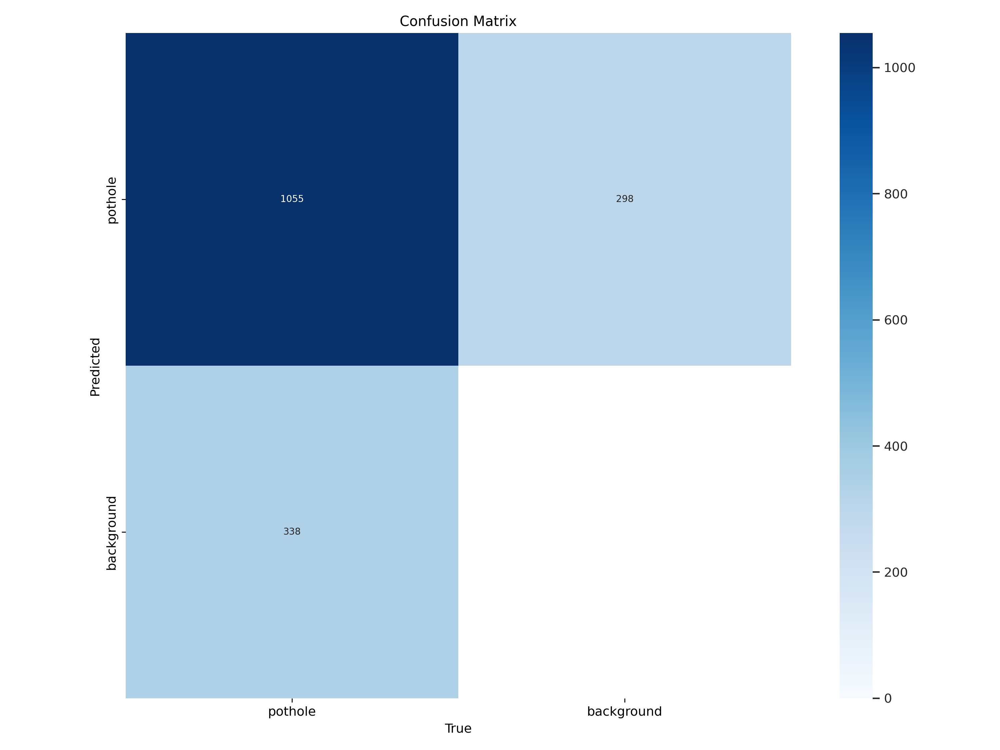

In [10]:
Image(results_path + "train/confusion_matrix.png", width=600)

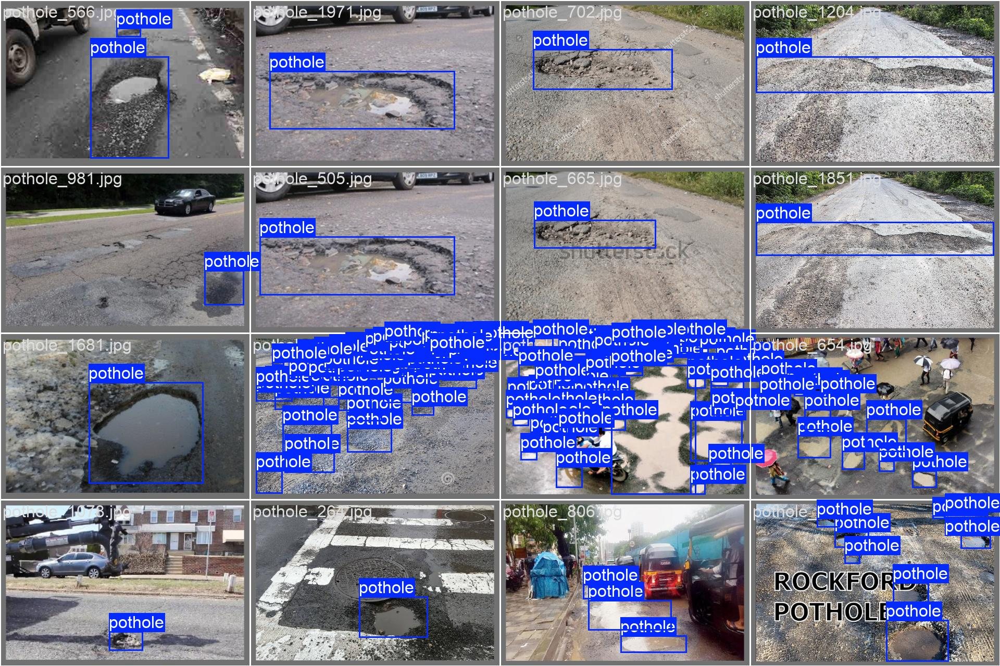

In [12]:
Image(results_path + "train/val_batch2_labels.jpg", width=800)

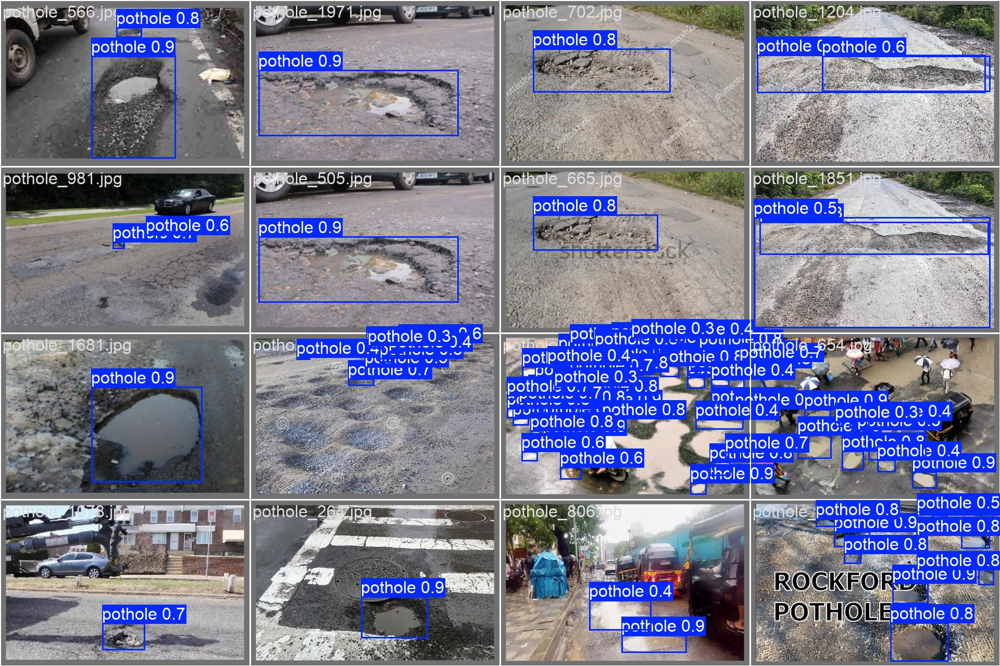

In [13]:
Image(results_path + "train/val_batch2_pred.jpg", width=800)

In [14]:
def validation_yolo_single_gpu(   
    data_path: str=data_yml_path,
    weights: str='/kaggle/working/runs/detect/train/weights/best.pt',
    imgsz: int=640,
    batch_size: int=batch_size,
    conf: float=0.25,
    iou: float=0.6,
    device: str='0', 
    **kwargs
    
    ):
    
    model = YOLO(weights)
    
    validation_results = model.val(
        data=data_path, 
        imgsz=imgsz, 
        batch=batch_size, 
        conf=conf, 
        iou=iou, 
        device=device,
        **kwargs
    )
    
    return validation_results

validation_results = validation_yolo_single_gpu()

Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /kaggle/input/potholes-detection-yolov8/valid/labels... 394 images, 0 backgrounds, 2 corrupt: 100%|██████████| 396/396 [00:01<00:00, 345.67it/s]

val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_1870.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'tif', 'png', 'webp', 'jpeg', 'pfm', 'dng', 'jpg', 'tiff', 'mpo', 'bmp', 'heic'}
videos: {'mp4', 'webm', 'wmv', 'm4v', 'avi', 'asf', 'gif', 'mkv', 'ts', 'mpg', 'mpeg', 'mov'}
val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg'
val: WARNING ⚠️ Cache directory /kaggle/input/potholes-detection-yolov8/valid is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]


                   all        394       1393      0.808      0.722      0.798      0.574
Speed: 0.2ms preprocess, 8.1ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val


In [15]:
print(validation_results.box.map)  # mAP50-95
print(validation_results.box.map50)  # mAP50
print(validation_results.box.map75)  # mAP75
print(validation_results.box.maps)  # list of mAP50-95 for each category

0.5737939141528386
0.7976881743481627
0.6565935388184749
[    0.57379]


In [16]:
def prediction_yolo_single_gpu(   
    source: str='/kaggle/input/potholes-detection-yolov8/sample_video.mp4',
    weights: str='/kaggle/working/runs/detect/train/weights/best.pt',
    conf: float=0.25,
    save: bool=True,
    **kwargs
    ):
    
    model = YOLO(weights)

    prediction_results = model.predict(
        source=source,  # path ke data
        conf=conf,  # confidence threshold
        save=save,  # simpan hasil prediksi
        **kwargs
    )
    
    return prediction_results

prediction_results = prediction_yolo_single_gpu()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 12 potholes, 44.2ms
video 1/1 (frame 2/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 11 potholes, 10.4ms
video 1/1 (frame 3/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 12 potholes, 10.4ms
video 1/1 (frame 4/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 13 potholes, 10.4ms
video 1/1 (frame

In [17]:
import os
from base64 import b64encode
from IPython.display import HTML, display

# Path of input video after prediction
save_path = '/kaggle/working/runs/detect/predict/sample_video.avi'

# Path of the output video to be compressed
compressed_path = "/kaggle/working/result_compressed.mp4"

# Kompres video menggunakan ffmpeg
os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

if os.path.exists(compressed_path):
    # Read the compressed video
    with open(compressed_path, "rb") as video_file:
        video_data = video_file.read()
    
    # Encode video in base64 so it can be displayed in HTML
    data_url = "data:video/mp4;base64," + b64encode(video_data).decode()

    # Embed and display video on notebook
    display(HTML(f"""
    <video width="640" height="480" controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """))
else:
    print("Video file not found.")


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab